## EDA For Data Analysis

**Notes**
* Uses same logic and tools as initial.ipynb, but on the total cleaned data.
* Also explores categories by year and state to better understand the trends of the data.

In [130]:
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
import math
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import requests
import json

In [96]:
%matplotlib inline

In [97]:
enrollment = pd.read_csv('data/cleaned_enrollmentdata.csv')

In [98]:
enrollment['State or jurisdiction'] = enrollment['State or jurisdiction'].str.strip()
enrollment = enrollment.drop_duplicates(subset=['State or jurisdiction', 'Year'])

In [99]:
enrollment.head()

,State or jurisdiction,Year,Total_Pub_Under,4y_Pub_Under,2y_Pub_Under,Total_Pub_Postbacc,Total_Priv_Under,Np_4y_Priv_Under,Fp_4y_Priv_Under,Np_2y_Priv_Under,Fp_2y_Priv_Under,Total_Priv_Postbacc,Np_4y_Priv_Postbacc,Fp_4y_Priv_Postbacc
0,Alabama,2012-13,216535,130260,86275,34510,49382,21674,24045,518,3145,9884,3917,5967
1,Alabama,2013-14,213669,129045,84624,34615,47519,20808,23295,472,2944,9909,3866,6043
2,Alabama,2014-15,212458,129916,82542,34531,47172,21160,22714,518,2780,10867,4354,6513
3,Alabama,2015-16,212968,131503,81465,34483,44682,20938,21000,436,2308,10826,4593,6233
4,Alabama,2016-17,216115,135080,81035,34923,41893,19891,19627,386,1989,11121,4679,6442


In [100]:
profile = ProfileReport(
    enrollment,
    title="State Enrollment Data Analysis",
    html={'style':{'full_width':True}},
    minimal=False)

In [101]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 14/14 [00:00<00:00, 555.49it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [102]:
alabama_yearly = enrollment[enrollment['State or jurisdiction'] == 'Alabama']
alabama_yearly

,State or jurisdiction,Year,Total_Pub_Under,4y_Pub_Under,2y_Pub_Under,Total_Pub_Postbacc,Total_Priv_Under,Np_4y_Priv_Under,Fp_4y_Priv_Under,Np_2y_Priv_Under,Fp_2y_Priv_Under,Total_Priv_Postbacc,Np_4y_Priv_Postbacc,Fp_4y_Priv_Postbacc
0,Alabama,2012-13,216535,130260,86275,34510,49382,21674,24045,518,3145,9884,3917,5967
1,Alabama,2013-14,213669,129045,84624,34615,47519,20808,23295,472,2944,9909,3866,6043
2,Alabama,2014-15,212458,129916,82542,34531,47172,21160,22714,518,2780,10867,4354,6513
3,Alabama,2015-16,212968,131503,81465,34483,44682,20938,21000,436,2308,10826,4593,6233
4,Alabama,2016-17,216115,135080,81035,34923,41893,19891,19627,386,1989,11121,4679,6442
5,Alabama,2017-18,217755,137019,80736,36316,41807,21369,18677,0,1761,10944,4780,6164
6,Alabama,2018-19,217610,137380,80230,37477,37784,21155,16523,0,106,11311,5106,6205
7,Alabama,2019-20,216326,136404,79922,38477,36888,20225,16126,0,537,11339,5322,6017
8,Alabama,2020-21,204632,133781,70851,41865,34753,19125,15077,0,551,10931,5388,5543
559,Alabama,2021-22,207241,131801,75440,42939,32151,18116,13201,295,539,10429,5478,4951


In [103]:
px.line(alabama_yearly, x='Year', y='Total_Pub_Under').show()

Wanting to comapre states a note:

Comparing states with different populations makes it difficult to simply graph all the states and compare them. To overcome this I am going to set a baseline year, and compare all the states to that year. I chose 2012-13 so every enrollment is now relative to 2012-13 for each state. The graphs are shown below.

## Comparing states over time

In [104]:
base_year = '2012-13'

base = enrollment[enrollment['Year'] == base_year][['State or jurisdiction', 'Total_Pub_Under', 'Total_Priv_Under']]
base.rename(columns={'Total_Pub_Under': 'base_Pub_Under', 'Total_Priv_Under': 'base_Priv_Under'}, inplace=True)
base['base_enrollment'] = base['base_Pub_Under'] + base['base_Priv_Under']
enrollment = enrollment.merge(base, how='left', on='State or jurisdiction')
enrollment['enrollment_index'] = ((enrollment['Total_Pub_Under'] + enrollment['Total_Priv_Under'])/enrollment['base_enrollment'])*100
enrollment

,State or jurisdiction,Year,Total_Pub_Under,4y_Pub_Under,2y_Pub_Under,Total_Pub_Postbacc,Total_Priv_Under,Np_4y_Priv_Under,Fp_4y_Priv_Under,Np_2y_Priv_Under,Fp_2y_Priv_Under,Total_Priv_Postbacc,Np_4y_Priv_Postbacc,Fp_4y_Priv_Postbacc,base_Pub_Under,base_Priv_Under,base_enrollment,enrollment_index
0,Alabama,2012-13,216535,130260,86275,34510,49382,21674,24045,518,3145,9884,3917,5967,216535.0,49382.0,265917.0,100.000000
1,Alabama,2013-14,213669,129045,84624,34615,47519,20808,23295,472,2944,9909,3866,6043,216535.0,49382.0,265917.0,98.221626
2,Alabama,2014-15,212458,129916,82542,34531,47172,21160,22714,518,2780,10867,4354,6513,216535.0,49382.0,265917.0,97.635728
3,Alabama,2015-16,212968,131503,81465,34483,44682,20938,21000,436,2308,10826,4593,6233,216535.0,49382.0,265917.0,96.891135
4,Alabama,2016-17,216115,135080,81035,34923,41893,19891,19627,386,1989,11121,4679,6442,216535.0,49382.0,265917.0,97.025764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
615,Marshall Islands,2021-22,1267,1267,0,0,0,0,0,0,0,0,0,0,1123.0,0.0,1123.0,112.822796
616,Northern Marianas,2021-22,1298,1298,0,0,0,0,0,0,0,0,0,0,1178.0,0.0,1178.0,110.186757
617,Palau,2021-22,525,0,525,0,0,0,0,0,0,0,0,0,680.0,0.0,680.0,77.205882
618,Puerto Rico,2021-22,43351,42409,942,5748,98665,67328,27089,0,4248,20536,17419,3117,56556.0,159416.0,215972.0,65.756672


In [105]:
states_per_subplot = 8

states = sorted(enrollment['State or jurisdiction'].unique())
states_per_figure = states_per_subplot * 2
num_figs = math.ceil(len(states) / states_per_figure)

y_min = enrollment['enrollment_index'].min() * 0.95
y_max = enrollment['enrollment_index'].max() * 1.05

for i in range(num_figs):
    fig = make_subplots(
        rows=1,
        cols=2,
        shared_yaxes=True,
        subplot_titles=("States Group A", "States Group B")
    )

    start = i * states_per_figure
    mid = start + states_per_subplot
    end = start + states_per_figure

    group_a = states[start:mid]
    group_b = states[mid:end]

    for state in group_a:
        state_df = enrollment[enrollment['State or jurisdiction'] == state]
        fig.add_trace(
            go.Scatter(
                x=state_df['Year'],
                y=state_df['enrollment_index'],
                mode='lines',
                name=state
            ),
            row=1,
            col=1
        )

    for state in group_b:
        state_df = enrollment[enrollment['State or jurisdiction'] == state]
        fig.add_trace(
            go.Scatter(
                x=state_df['Year'],
                y=state_df['enrollment_index'],
                mode='lines',
                name=state
            ),
            row=1,
            col=2
        )

    # baseline
    fig.add_hline(y=100, line_dash="dash")

    fig.update_yaxes(range=[y_min, y_max])
    fig.update_layout(
        height=500,
        width=1200,
        title_text=(
            "Public Undergraduate Enrollment Index<br>"
            f"States {start + 1}–{min(end, len(states))}"
        ),
        legend_title_text="State",
        hovermode="x unified"
    )

    fig.show()


In [106]:
enrollment['yoy_change'] = enrollment.groupby('State or jurisdiction')['enrollment_index'].pct_change()

/var/folders/6g/_wpr8bs53rs84lqb6nn_rk900000gn/T/ipykernel_84785/872818003.py:1: FutureWarning:

The default fill_method='ffill' in SeriesGroupBy.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



In [107]:
state_yoy_summary = (
    enrollment
    .groupby('State or jurisdiction')['yoy_change']
    .mean()
    .dropna()
    .reset_index()
)

state_yoy_summary.rename(
    columns={'yoy_change': 'mean_yoy_change'},
    inplace=True
)


In [108]:
px.histogram(
    state_yoy_summary,
    x=state_yoy_summary['mean_yoy_change'] * 100,
    nbins=15,
    title='Mean Year-over-Year Enrollment Change by State',
    labels={'x': 'Mean YoY Enrollment Change (%)'}
).add_vline(x=0, line_dash='dash')

The majority of states have seen a decline in enrollment over the last 4 years.

In [109]:
enrollment['pub_priv_ratio_year'] = np.where(
    enrollment['Total_Priv_Under'] > 0,
    enrollment['Total_Pub_Under'] / enrollment['Total_Priv_Under'],
    np.nan
)
yearly_ratio = (
    enrollment
    .groupby('Year')['pub_priv_ratio_year']
    .mean()
    .reset_index()
)

yearly_ratio

,Year,pub_priv_ratio_year
0,2012-13,5.812959
1,2013-14,5.984620
2,2014-15,6.228986
3,2015-16,7.111661
4,2016-17,7.553456
5,2017-18,8.249929
6,2018-19,21.620944
7,2019-20,9.349698
8,2020-21,6.399322
9,2021-22,6.782988


In [110]:
px.line(yearly_ratio, x='Year', y='pub_priv_ratio_year').show()

In 2018 we saw a massive jump in the ratio of public to private enrollment, but then it returned to normal. Private enrollment is never higher than public which makes sense. I also explore the weighted ratio to take into account the size of each state.

In [111]:
weighted_ratio = (
    enrollment
    .groupby('Year')
    .agg(
        total_public=('Total_Pub_Under', 'sum'),
        total_private=('Total_Priv_Under', 'sum')
    )
    .reset_index()
)

weighted_ratio['pub_priv_ratio_weighted'] = (
    weighted_ratio['total_public'] / weighted_ratio['total_private']
)

In [112]:
px.line(weighted_ratio, x='Year', y='pub_priv_ratio_weighted').show(
    
)

More normalized than before, we see the ratio of public to private enrollment is increasing as time goes on. This could be due to students finding private institutions too expensive or prefering public schools for some reason.

## Rank of States by Enrollment

In [126]:
enrollment['rank_index'] = enrollment.groupby('Year')['enrollment_index'].rank(ascending=False, method='min')

rank_matrix = enrollment.pivot(
    index='State or jurisdiction', 
    columns='Year', 
    values='rank_index'
)


In [127]:
first_year = '2012-13'
rank_matrix = rank_matrix.sort_values(by=first_year)



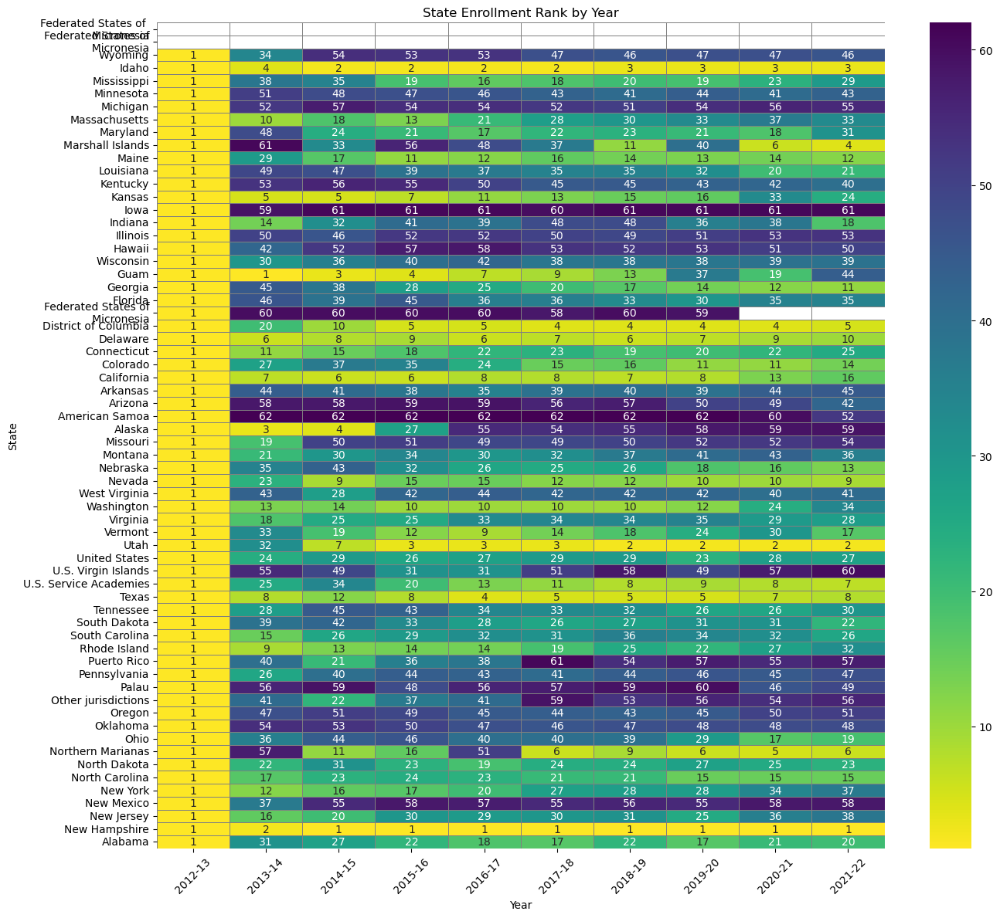

In [128]:
plt.figure(figsize=(14, 12))
sns.heatmap(
    rank_matrix,                # keep the DataFrame indexed by state
    cmap='viridis_r',           # darker = better
    linewidths=0.5,
    linecolor='gray',
    annot=True,
    fmt=".0f"
)

plt.gca().invert_yaxis()  # rank 1 at the top
plt.xticks(rotation=45)
plt.title('State Enrollment Rank by Year')
plt.xlabel('Year')
plt.ylabel('State')
plt.tight_layout()
plt.show()

Not a great visualization I do not like.

## Chloropleth Map Attempt

In [131]:
r = requests.get('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json')
geojson = json.loads(r.text)

In [132]:
geojson

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'GEO_ID': '0500000US01001',
    'STATE': '01',
    'COUNTY': '001',
    'NAME': 'Autauga',
    'LSAD': 'County',
    'CENSUSAREA': 594.436},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-86.496774, 32.344437],
      [-86.717897, 32.402814],
      [-86.814912, 32.340803],
      [-86.890581, 32.502974],
      [-86.917595, 32.664169],
      [-86.71339, 32.661732],
      [-86.714219, 32.705694],
      [-86.413116, 32.707386],
      [-86.411172, 32.409937],
      [-86.496774, 32.344437]]]},
   'id': '01001'},
  {'type': 'Feature',
   'properties': {'GEO_ID': '0500000US01009',
    'STATE': '01',
    'COUNTY': '009',
    'NAME': 'Blount',
    'LSAD': 'County',
    'CENSUSAREA': 644.776},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-86.577799, 33.765316],
      [-86.759144, 33.840617],
      [-86.953664, 33.815297],
      [-86.954305, 33.844862],
      [-86.96296, 33.844865],
      [-86.9

In [134]:
state_abbrev = {
    'Alabama':'AL','Alaska':'AK','Arizona':'AZ','Arkansas':'AR','California':'CA',
    'Colorado':'CO','Connecticut':'CT','Delaware':'DE','Florida':'FL','Georgia':'GA',
    'Hawaii':'HI','Idaho':'ID','Illinois':'IL','Indiana':'IN','Iowa':'IA',
    'Kansas':'KS','Kentucky':'KY','Louisiana':'LA','Maine':'ME','Maryland':'MD',
    'Massachusetts':'MA','Michigan':'MI','Minnesota':'MN','Mississippi':'MS','Missouri':'MO',
    'Montana':'MT','Nebraska':'NE','Nevada':'NV','New Hampshire':'NH','New Jersey':'NJ',
    'New Mexico':'NM','New York':'NY','North Carolina':'NC','North Dakota':'ND','Ohio':'OH',
    'Oklahoma':'OK','Oregon':'OR','Pennsylvania':'PA','Rhode Island':'RI','South Carolina':'SC',
    'South Dakota':'SD','Tennessee':'TN','Texas':'TX','Utah':'UT','Vermont':'VT',
    'Virginia':'VA','Washington':'WA','West Virginia':'WV','Wisconsin':'WI','Wyoming':'WY'
}

enrollment['abbrev'] = enrollment['State or jurisdiction'].map(state_abbrev)
enrollment.head()

,State or jurisdiction,Year,Total_Pub_Under,4y_Pub_Under,2y_Pub_Under,Total_Pub_Postbacc,Total_Priv_Under,Np_4y_Priv_Under,Fp_4y_Priv_Under,Np_2y_Priv_Under,...,Np_4y_Priv_Postbacc,Fp_4y_Priv_Postbacc,base_Pub_Under,base_Priv_Under,base_enrollment,enrollment_index,yoy_change,pub_priv_ratio_year,rank_index,abbrev
0,Alabama,2012-13,216535,130260,86275,34510,49382,21674,24045,518,...,3917,5967,216535.0,49382.0,265917.0,100.000000,NaN,4.384897,1.0,AL
1,Alabama,2013-14,213669,129045,84624,34615,47519,20808,23295,472,...,3866,6043,216535.0,49382.0,265917.0,98.221626,-0.017784,4.496496,31.0,AL
2,Alabama,2014-15,212458,129916,82542,34531,47172,21160,22714,518,...,4354,6513,216535.0,49382.0,265917.0,97.635728,-0.005965,4.503901,27.0,AL
3,Alabama,2015-16,212968,131503,81465,34483,44682,20938,21000,436,...,4593,6233,216535.0,49382.0,265917.0,96.891135,-0.007626,4.766304,22.0,AL
4,Alabama,2016-17,216115,135080,81035,34923,41893,19891,19627,386,...,4679,6442,216535.0,49382.0,265917.0,97.025764,0.001389,5.158738,18.0,AL


In [149]:

state_enrollment = enrollment[enrollment['abbrev'].isna()== False]
state_enrollment

,State or jurisdiction,Year,Total_Pub_Under,4y_Pub_Under,2y_Pub_Under,Total_Pub_Postbacc,Total_Priv_Under,Np_4y_Priv_Under,Fp_4y_Priv_Under,Np_2y_Priv_Under,...,Np_4y_Priv_Postbacc,Fp_4y_Priv_Postbacc,base_Pub_Under,base_Priv_Under,base_enrollment,enrollment_index,yoy_change,pub_priv_ratio_year,rank_index,abbrev
0,Alabama,2012-13,216535,130260,86275,34510,49382,21674,24045,518,...,3917,5967,216535.0,49382.0,265917.0,100.000000,NaN,4.384897,1.0,AL
1,Alabama,2013-14,213669,129045,84624,34615,47519,20808,23295,472,...,3866,6043,216535.0,49382.0,265917.0,98.221626,-0.017784,4.496496,31.0,AL
2,Alabama,2014-15,212458,129916,82542,34531,47172,21160,22714,518,...,4354,6513,216535.0,49382.0,265917.0,97.635728,-0.005965,4.503901,27.0,AL
3,Alabama,2015-16,212968,131503,81465,34483,44682,20938,21000,436,...,4593,6233,216535.0,49382.0,265917.0,96.891135,-0.007626,4.766304,22.0,AL
4,Alabama,2016-17,216115,135080,81035,34923,41893,19891,19627,386,...,4679,6442,216535.0,49382.0,265917.0,97.025764,0.001389,5.158738,18.0,AL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
605,Virginia,2021-22,318019,171133,146886,51225,108833,85146,20577,140,...,65104,3033,360859.0,131693.0,492552.0,86.661307,-0.030547,2.922082,28.0,VA
606,Washington,2021-22,248434,228588,19846,27754,33631,27627,3542,940,...,11514,97,288656.0,40961.0,329617.0,85.573560,-0.044544,7.387054,34.0,WA
607,West Virginia,2021-22,60591,48139,12452,11250,49731,5973,40642,0,...,1154,9554,80594.0,55561.0,136155.0,81.026771,-0.041012,1.218375,41.0,WV
608,Wisconsin,2021-22,234041,149295,84746,25779,40576,38671,1733,0,...,14996,96,269565.0,60208.0,329773.0,83.274556,-0.016654,5.767966,39.0,WI


In [151]:
print(enrollment[enrollment['abbrev'].isna()== True]['State or jurisdiction'].unique())

['American Samoa' 'District of Columbia'
 'Federated States of\n   Micronesia' 'Federated States of\n  Micronesia'
 'Guam' 'Marshall Islands' 'Northern Marianas' 'Other jurisdictions'
 'Palau' 'Puerto Rico' 'U.S. Service Academies' 'U.S. Virgin Islands'
 'United States' 'Federated States of \n   Micronesia']


Discluded these territories for the regional map for now. Thes are not states and do not contribute much to the map.

In [148]:
state_enrollment_2013 = state_enrollment[state_enrollment['Year'] == '2013-14']
fig = go.Figure(go.Choropleth(
    locationmode = 'USA-states',
    locations = state_enrollment_2013['abbrev'],
    z = state_enrollment_2013['enrollment_index'],
    colorscale = 'Reds',
))

fig.update_layout(
    title_text = '2013-14 US Enrollment Compared to Baseline by State',
    geo_scope='usa',
)

fig.show()

Chose the first year after baseline to compare.